In [2]:
!pip3 install wordcloud

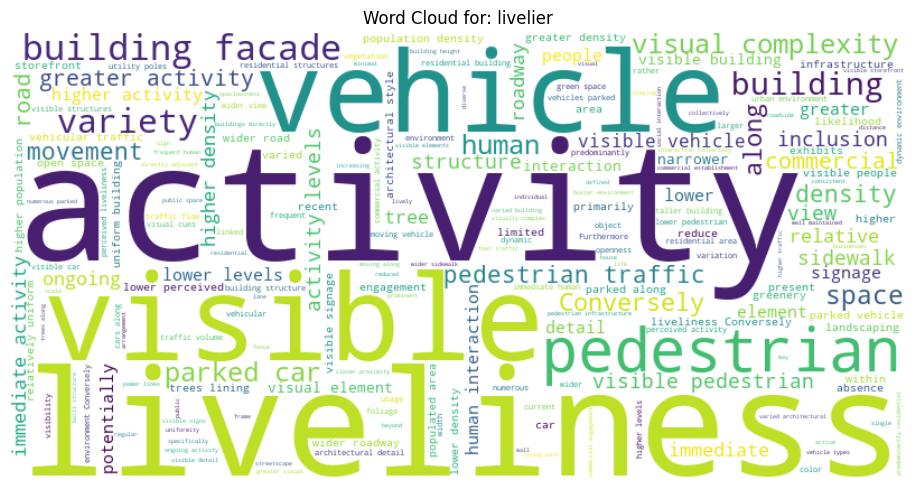

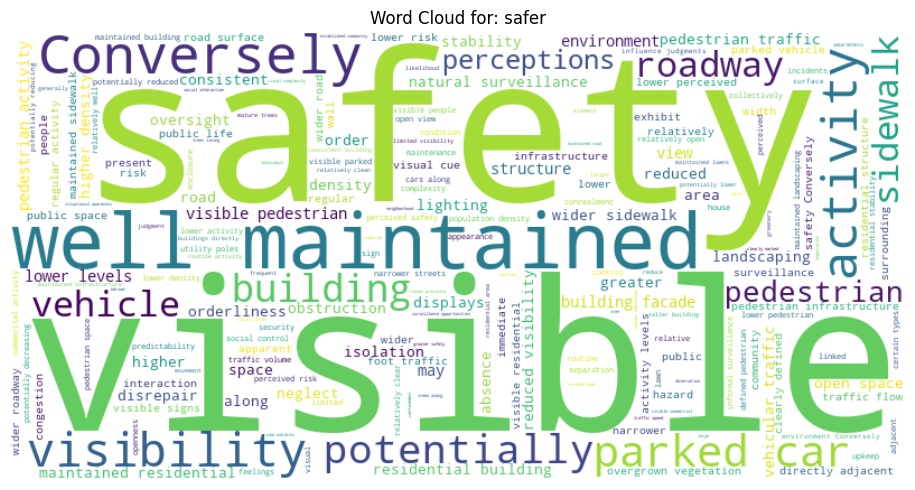

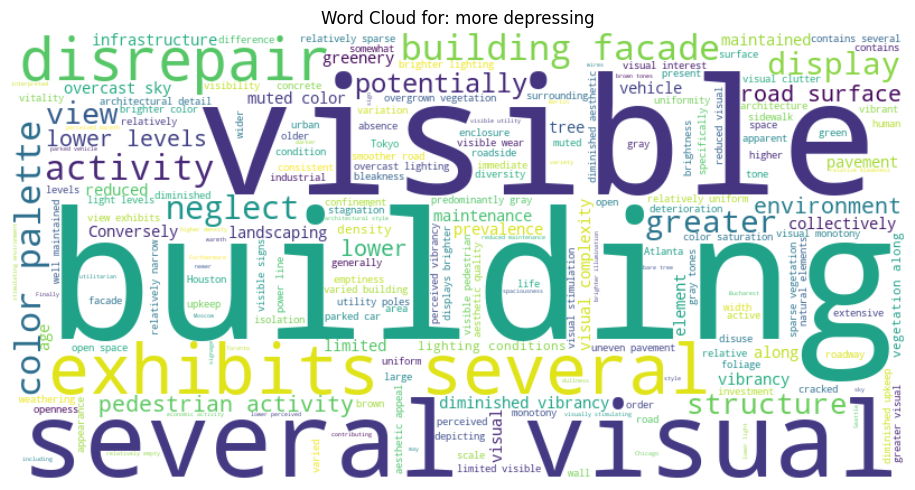

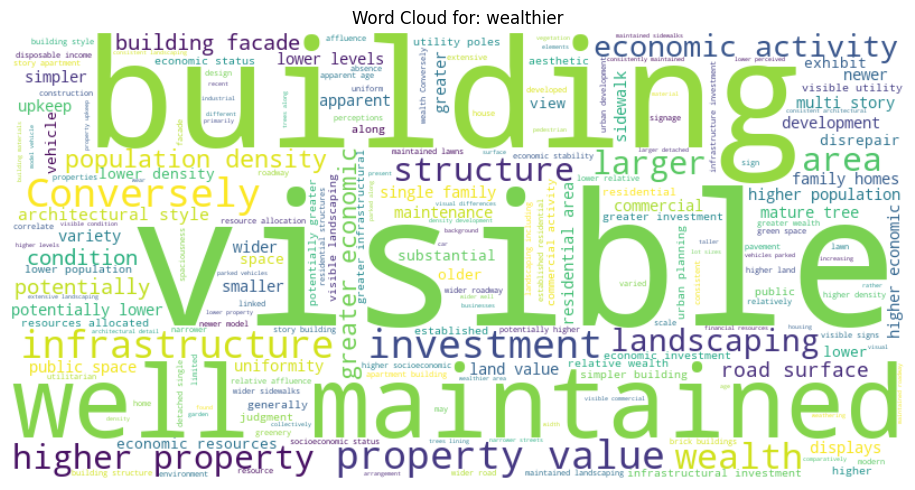

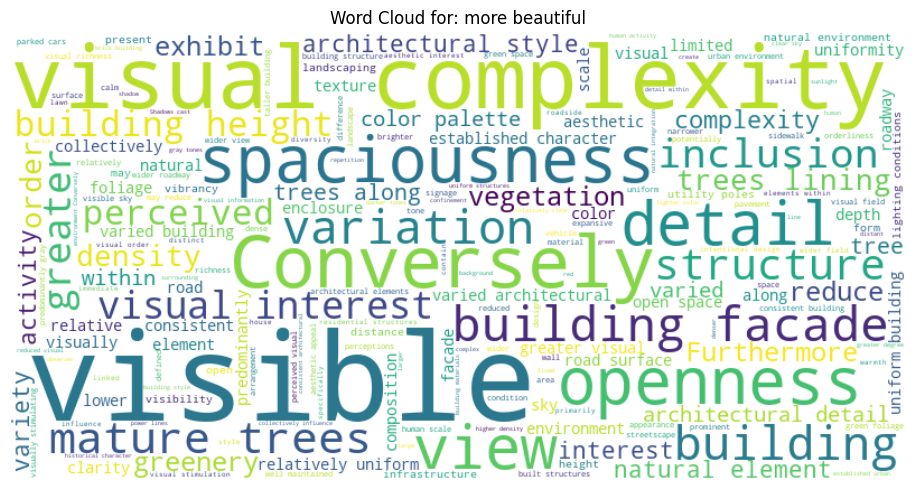

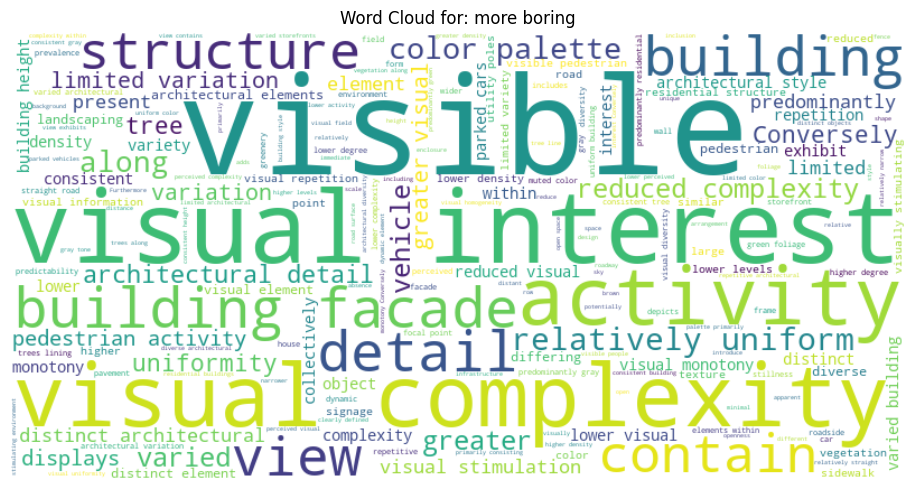

In [10]:
import pandas as pd
from wordcloud import WordCloud, STOPWORDS
import matplotlib.pyplot as plt

# Load your file
df = pd.read_csv("results_gemma-3-27b-it/llm_predictions_3-27b-it_Zero-shot3-GEO.csv")

# Normalize study_question
df["study_question"] = df["study_question"].str.strip().str.lower()

# Define full stopword set (default + custom)
custom_stopwords = STOPWORDS.union({
    "left", "right", "side", "image", "images", "provided", "due", "lack",
    "take", "off", "combination", "factors", "factor", "suggesting",
    "suggestion", "suggest", "based", "appear", "appears", "significantly",
    "overall", "better", "street", "less", "compared", "feels", "contributes",
    "looks", "feeling", "ranking", "suggests", "shows", "sides", "care",
    "cared", "sense", "immediately", "often", "reasons", "reason", "which", "contrast",
    "level", "high", "low", "use", "potential", "increase", "decrease",
    "increased", "decreased", "increases", "decreases", "great", "multiple", 
    "presences", "presence", "impression", "associate", "associated", "perception", "play",
    "plays", "role", "roles", "shaping", "fewer", "feature", "features", "contribute", "additionally", "scene", "scenes"
})

# Generate word clouds per class
for question in df["study_question"].unique():
    text = " ".join(df[df["study_question"] == question]["model_reason"].dropna().astype(str))
    wordcloud = WordCloud(
        width=800,
        height=400,
        background_color="white",
        stopwords=custom_stopwords
    ).generate(text)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(f"Word Cloud for: {question}")
    plt.tight_layout()
    plt.show()



In [2]:
from openai import OpenAI
import os
import pandas as pd
import base64
import io
from PIL import Image
import os
import json
import re

# Point to the local server
client = OpenAI(base_url="http://localhost:1234/v1", api_key="lm-studio")
print(client.models.list())
model_name = 'google/gemma-3-27b'
output_dir = f"results_{model_name}"

SyncPage[Model](data=[Model(id='text-embedding-nomic-embed-text-v1.5@q4_k_m', created=None, object='model', owned_by='organization_owner'), Model(id='google/gemma-3-27b', created=None, object='model', owned_by='organization_owner'), Model(id='qwen/qwen2.5-vl-7b', created=None, object='model', owned_by='organization_owner'), Model(id='gemma-3-4b-it-qat', created=None, object='model', owned_by='organization_owner'), Model(id='llava-v1.5-7b', created=None, object='model', owned_by='organization_owner'), Model(id='granite-vision-3.2-2b', created=None, object='model', owned_by='organization_owner'), Model(id='text-embedding-nomic-embed-text-v1.5@q8_0', created=None, object='model', owned_by='organization_owner')], object='list')


In [ ]:
# Load metadata
prompt_method = "Zero-shot1-GEO"
prediction_df = pd.read_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_gemma-3-27b_Zero-shot1-GEO_all.csv")
logic_chains = []

for _, row in prediction_df.iterrows():
    model_reason = row["model_reason"]
    study_question = row["study_question"]
    # Compose LLM prompt
    chain_prompt = f"""
                    You were comparing two street view images to determine which one better reflects the following quality:

                    "{study_question}"

                    Based on your explanation, break down your reasoning into a clear step-by-step logic chain.

                    Format: Step 1 → Step 2 → Step 3 → ... (as many steps as needed)

                    Explanation: {model_reason}
                    """
    # Call LLM 
    response = client.chat.completions.create(
        model= model_name,
        messages=[
            {
                "role": "user",
                "content": [{"type": "text", "text": chain_prompt.strip()}],
            },
        ],
        
    )
    raw = response.choices[0].message.content.strip()
    print(raw)
    logic_chains.append(raw)

# Append new column to original DataFrame
df["logic_chain"] = logic_chains

# Overwrite or save as new file
df.to_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_gemma-3-27b_Zero-shot1-GEO_all_explanation.csv", index=False)  # Overwrite
# df.to_csv("updated_with_logic_chain.csv", index=False)  # Optional: save as new file

Okay, here's the breakdown of my reasoning into a step-by-step logic chain, based on the provided explanation for determining which street view image is "livelier":

**Step 1 → Define "Livelier" in a Street View Context:** The core concept of “livelier” when applied to a street view implies a sense of activity, vibrancy, and human presence. It's not just *being* populated, but also suggesting an area people *want* to be in.

**Step 2 → Identify Key Visual Indicators of Activity:**  To assess liveliness from a static image, we look for proxies like:
    * **Number of People:** More pedestrians generally indicate more activity.
    * **Vehicle Presence/Use:** Parked and moving cars suggest the street is being utilized.
    * **Signs of Recent Use:** Cleanliness, well-maintained spaces imply ongoing activity (people are *using* it enough to require upkeep).

**Step 3 → Observe Image Feature: Human Presence & Vehicle Count - Paris Side:** The Paris side image demonstrably shows a significa

In [4]:
import pandas as pd

# Load prediction and metadata files
pred_df = pd.read_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_gemma-3-27b_Zero-shot1-GEO_all_explanation.csv")
meta_df = pd.read_csv("merged_metadata.csv")

# Normalize columns
meta_df["left"] = meta_df["left"].astype(str)
meta_df["right"] = meta_df["right"].astype(str)
pred_df["left"] = pred_df["left"].astype(str)
pred_df["right"] = pred_df["right"].astype(str)

# Merge city info from metadata
merged = pd.merge(
    pred_df,
    meta_df[["merged_index", "place_name_left", "place_name_right"]],
    on="merged_index",
    how="left"
)

# Save result
merged.to_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_gemma-3-27b_Zero-shot1-GEO_all_with_city.csv", index=False)
print("✅ City names added and saved to 'llm_predictions_gemma-3-27b_Zero-shot1-GEO_all_with_city.csv'")


✅ City names added and saved to 'llm_predictions_gemma-3-27b_Zero-shot1-GEO_all_with_city.csv'


In [5]:
import pandas as pd

# Load merged file
df = pd.read_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_gemma-3-27b_Zero-shot1-GEO_all_with_city.csv")

# Split by validation value
df_correct = df[df["validation"] == 1].copy()
df_wrong = df[df["validation"] == 0].copy()

# Save each group
df_correct.to_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_correct.csv", index=False)
df_wrong.to_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_wrong.csv", index=False)

print("✅ Split complete: saved 'llm_predictions_correct.csv' and 'llm_predictions_wrong.csv'")


✅ Split complete: saved 'llm_predictions_correct.csv' and 'llm_predictions_wrong.csv'


Casual Graph

In [ ]:
import pandas as pd
import nltk
import os
import matplotlib.pyplot as plt
import networkx as nx
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import defaultdict

# Setup
nltk.download("punkt")
nltk.download("stopwords")

# Load data
df = pd.read_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_gemma-3-27b_Zero-shot1-GEO_all_with_city.csv")
df["study_question"] = df["study_question"].str.strip().str.lower()

# Output folder
os.makedirs("layered_causal_graphs", exist_ok=True)

# Custom stopwords
custom_stopwords = set(stopwords.words("english"))
custom_stopwords.update([
    "left", "right", "side", "image", "images", "provided", "due", "lack",
    "take", "off", "combination", "factors", "factor", "suggesting",
    "suggestion", "suggest", "based", "appear", "appears", "significantly",
    "overall", "better", "street", "less", "compared", "feels", "contributes",
    "looks", "feeling", "street", "road", "roads", "ranking", "suggests",
    "shows", "sides", "care", "cared", "sense", "immediately", "often"
])

# Process each question
for question in df["study_question"].unique():
    text_series = df[df["study_question"] == question]["model_reason"].dropna().astype(str)

    # Step 1: average word position
    position_sum = defaultdict(float)
    position_count = defaultdict(int)

    for reason in text_series:
        tokens = word_tokenize(reason.lower())
        filtered = [w for w in tokens if w.isalpha() and w not in custom_stopwords]
        for idx, word in enumerate(filtered):
            position_sum[word] += idx
            position_count[word] += 1

    word_avg_position = {
        w: position_sum[w] / position_count[w]
        for w in position_sum if position_count[w] > 1
    }

    if not word_avg_position:
        continue

    # Step 2: assign layers
    min_pos, max_pos = min(word_avg_position.values()), max(word_avg_position.values())
    word_layer_map = {}
    for word, avg in word_avg_position.items():
        norm = (avg - min_pos) / (max_pos - min_pos)
        if norm <= 0.33:
            word_layer_map[word] = 1
        elif norm <= 0.66:
            word_layer_map[word] = 2
        else:
            word_layer_map[word] = 3

    # Step 3: build graph
    G = nx.DiGraph()
    for reason in text_series:
        tokens = word_tokenize(reason.lower())
        filtered = [w for w in tokens if w.isalpha() and w not in custom_stopwords and w in word_layer_map]
        for i in range(len(filtered) - 1):
            w1, w2 = filtered[i], filtered[i + 1]
            l1, l2 = word_layer_map[w1], word_layer_map[w2]
            if l1 < l2:
                if G.has_edge(w1, w2):
                    G[w1][w2]["weight"] += 1
                else:
                    G.add_edge(w1, w2, weight=1)

    # Step 4: filter top 5% edges
    weights = [d["weight"] for _, _, d in G.edges(data=True)]
    if not weights:
        continue
    threshold = sorted(weights, reverse=True)[int(len(weights) * 0.95)]
    G = nx.DiGraph(( (u,v,d) for u,v,d in G.edges(data=True) if d["weight"] >= threshold ))

    if G.number_of_edges() == 0:
        continue

    # Step 5: assign subset attribute to each node
    for node in G.nodes():
        G.nodes[node]["subset"] = word_layer_map.get(node, 1)

    # Step 6: draw and save
    plt.figure(figsize=(16, 10))
    pos = nx.multipartite_layout(G, subset_key="subset")
    weights = [G[u][v]["weight"] for u, v in G.edges()]
    nx.draw_networkx_nodes(G, pos, node_size=800, node_color="skyblue")
    nx.draw_networkx_labels(G, pos, font_size=10)
    nx.draw_networkx_edges(G, pos, width=weights, edge_color="gray", arrows=True, arrowstyle="-|>", arrowsize=12)
    plt.title(f"Causal Graph by Layer: {question}", fontsize=14)
    plt.axis("off")
    plt.tight_layout()
    filename = f"layered_causal_graphs/causal_graph_{question.replace(' ', '_')}.png"
    plt.savefig(filename, dpi=300, facecolor='white')
    plt.close()

print("✅ All layered causal graphs saved in 'layered_causal_graphs/'")


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\zwang31\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\zwang31\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


✅ All causal graphs saved using top 30 words per category.


Layered Casual Graph

In [ ]:
import pandas as pd
import nltk
import os
import matplotlib.pyplot as plt
import networkx as nx
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import defaultdict, Counter

# Setup
nltk.download("punkt")
nltk.download("stopwords")

# Load data
df = pd.read_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_gemma-3-27b_Zero-shot1-GEO_all_with_city.csv")
df["study_question"] = df["study_question"].str.strip().str.lower()

# Output folder
os.makedirs("layered_causal_graphs_top30", exist_ok=True)

# Custom stopwords
custom_stopwords = set(stopwords.words("english"))
custom_stopwords.update([
    "left", "right", "side", "image", "images", "provided", "due", "lack",
    "take", "off", "combination", "factors", "factor", "suggesting",
    "suggestion", "suggest", "based", "appear", "appears", "significantly",
    "overall", "better", "street", "less", "compared", "feels", "contributes",
    "looks", "feeling", "street", "road", "roads", "ranking", "suggests",
    "shows", "sides", "care", "cared", "sense", "immediately", "often", "reasons", "reason"
])

# Process each question
for question in df["study_question"].unique():
    text_series = df[df["study_question"] == question]["model_reason"].dropna().astype(str)

    position_sum = defaultdict(float)
    position_count = defaultdict(int)
    word_freq = Counter()

    # Count position and frequency
    tokenized_reasons = []
    for reason in text_series:
        tokens = word_tokenize(reason.lower())
        filtered = [w for w in tokens if w.isalpha() and w not in custom_stopwords]
        tokenized_reasons.append(filtered)
        for idx, word in enumerate(filtered):
            position_sum[word] += idx
            position_count[word] += 1
            word_freq[word] += 1

    # Get top 30 words
    top_words = set([w for w, _ in word_freq.most_common(30)])
    if not top_words:
        continue

    word_avg_position = {
        w: position_sum[w] / position_count[w]
        for w in top_words if position_count[w] > 1
    }

    # Assign layers
    min_pos, max_pos = min(word_avg_position.values()), max(word_avg_position.values())
    word_layer_map = {}
    for word, avg in word_avg_position.items():
        norm = (avg - min_pos) / (max_pos - min_pos)
        if norm <= 0.33:
            word_layer_map[word] = 1
        elif norm <= 0.66:
            word_layer_map[word] = 2
        else:
            word_layer_map[word] = 3

    # Build graph
    G = nx.DiGraph()
    for tokens in tokenized_reasons:
        filtered = [w for w in tokens if w in top_words and w in word_layer_map]
        for i in range(len(filtered) - 1):
            w1, w2 = filtered[i], filtered[i + 1]
            if word_layer_map[w1] < word_layer_map[w2]:
                if G.has_edge(w1, w2):
                    G[w1][w2]["weight"] += 1
                else:
                    G.add_edge(w1, w2, weight=1)

    if G.number_of_edges() == 0:
        continue

    # Add subset key for layout
    for node in G.nodes():
        G.nodes[node]["subset"] = word_layer_map.get(node, 1)

    # Draw and save
    plt.figure(figsize=(16, 10))
    pos = nx.multipartite_layout(G, subset_key="subset")
    max_weight = max(nx.get_edge_attributes(G, "weight").values())
    weights = [G[u][v]["weight"] / max_weight * 5 for u, v in G.edges()]

    nx.draw_networkx_nodes(G, pos, node_size=800, node_color="skyblue")
    nx.draw_networkx_labels(G, pos, font_size=10)
    nx.draw_networkx_edges(G, pos, width=weights, edge_color="gray", arrows=True, arrowstyle="-|>", arrowsize=1)
    plt.title(f"Causal Graph (Top 30 Words): {question}", fontsize=14)
    plt.axis("off")
    plt.tight_layout()
    filename = f"layered_causal_graphs_top30/causal_graph_top30_{question.replace(' ', '_')}.png"
    plt.savefig(filename, dpi=300, facecolor='white')
    plt.close()

print("✅ All causal graphs saved using top 30 words per category.")


Greenery Causal Graph

In [33]:
import pandas as pd
import nltk
import os
import matplotlib.pyplot as plt
import networkx as nx
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import defaultdict, Counter

# Setup
nltk.download("punkt")
nltk.download("stopwords")

# Load data
df = pd.read_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_gemma-3-27b_Zero-shot1-GEO_all_with_city.csv")
df["study_question"] = df["study_question"].str.strip().str.lower()
df["model_reason"] = df["model_reason"].astype(str).str.lower()

# Output folders
os.makedirs("layered_causal_graphs_top30_green", exist_ok=True)
os.makedirs("layered_causal_graphs_top30_no_green", exist_ok=True)

# Custom stopwords
custom_stopwords = set(stopwords.words("english"))
custom_stopwords.update([
    "left", "right", "side", "image", "images", "provided", "due", "lack",
    "take", "off", "combination", "factors", "factor", "suggesting",
    "suggestion", "suggest", "based", "appear", "appears", "significantly",
    "overall", "better", "street", "less", "compared", "feels", "contributes",
    "looks", "feeling", "street", "road", "roads", "ranking", "suggests",
    "shows", "sides", "care", "cared", "sense", "immediately", "often", "reasons", "reason"
])

green_keywords = ["greenery", "vegetation", "tree", "trees"]

# Group for both cases
for tag, subset_df in {
    "green": df[df["model_reason"].apply(lambda x: any(k in x for k in green_keywords))],
    "no_green": df[df["model_reason"].apply(lambda x: not any(k in x for k in green_keywords))]
}.items():
    
    if tag == "green":
        output_dir = "layered_causal_graphs_top30_green"
    else:
        output_dir = "layered_causal_graphs_top30_no_green"

    for question in subset_df["study_question"].unique():
        text_series = subset_df[subset_df["study_question"] == question]["model_reason"].dropna()

        position_sum = defaultdict(float)
        position_count = defaultdict(int)
        word_freq = Counter()
        tokenized_reasons = []

        for reason in text_series:
            tokens = word_tokenize(reason)
            filtered = [w for w in tokens if w.isalpha() and w not in custom_stopwords]
            tokenized_reasons.append(filtered)
            for idx, word in enumerate(filtered):
                position_sum[word] += idx
                position_count[word] += 1
                word_freq[word] += 1

        top_words = set([w for w, _ in word_freq.most_common(30)])
        if not top_words:
            continue

        word_avg_position = {
            w: position_sum[w] / position_count[w]
            for w in top_words if position_count[w] > 1
        }

        # Assign layers by position percentiles
        min_pos, max_pos = min(word_avg_position.values()), max(word_avg_position.values())
        word_layer_map = {}
        for word, avg in word_avg_position.items():
            norm = (avg - min_pos) / (max_pos - min_pos)
            if norm <= 0.33:
                word_layer_map[word] = 1
            elif norm <= 0.66:
                word_layer_map[word] = 2
            else:
                word_layer_map[word] = 3

        # Build graph
        G = nx.DiGraph()
        for tokens in tokenized_reasons:
            filtered = [w for w in tokens if w in top_words and w in word_layer_map]
            for i in range(len(filtered) - 1):
                w1, w2 = filtered[i], filtered[i + 1]
                if word_layer_map[w1] < word_layer_map[w2]:
                    if G.has_edge(w1, w2):
                        G[w1][w2]["weight"] += 1
                    else:
                        G.add_edge(w1, w2, weight=1)

        if G.number_of_edges() == 0:
            continue

        for node in G.nodes():
            G.nodes[node]["subset"] = word_layer_map.get(node, 1)

        # Draw and save
        plt.figure(figsize=(16, 10))
        pos = nx.multipartite_layout(G, subset_key="subset")
        max_weight = max(nx.get_edge_attributes(G, "weight").values())
        weights = [G[u][v]["weight"] / max_weight * 5 for u, v in G.edges()]

        nx.draw_networkx_nodes(G, pos, node_size=800, node_color="skyblue")
        nx.draw_networkx_labels(G, pos, font_size=10)
        nx.draw_networkx_edges(G, pos, width=weights, edge_color="gray", arrows=True, arrowstyle="-|>", arrowsize=1)

        plt.title(f"Causal Graph (Top 30 Words, {tag.replace('_', ' ')}): {question}", fontsize=14)
        plt.axis("off")
        plt.tight_layout()
        filename = f"{output_dir}/causal_graph_top30_{question.replace(' ', '_')}.png"
        plt.savefig(filename, dpi=300, facecolor='white')
        plt.close()

print("✅ Layered causal graphs saved for both greenery and non-greenery cases.")


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\zwang31\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\zwang31\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


✅ Layered causal graphs saved for both greenery and non-greenery cases.


non-Greenery Causal Graph

In [31]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import networkx as nx
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import nltk
from collections import Counter

nltk.download("punkt")
nltk.download("stopwords")

# Load data
df = pd.read_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_gemma-3-27b_Zero-shot1-GEO_all_with_city.csv")
df["study_question"] = df["study_question"].str.strip().str.lower()
df["model_reason"] = df["model_reason"].astype(str).str.lower()

# Filter rows without greenery keywords
green_keywords = ["greenery", "vegetation", "tree", "trees"]
df_nogreen = df[~df["model_reason"].apply(lambda x: any(k in x for k in green_keywords))]

# Stopwords
custom_stopwords = set(stopwords.words("english"))
custom_stopwords.update([
    "left", "right", "side", "image", "images", "provided", "due", "lack", 
    "take", "off", "combination", "factors", "factor", "suggesting",
    "suggestion", "suggest", "based", "appear", "appears", "significantly", 
    "overall", "better", "street", "less", "compared", "feels", "contributes", "looks", "feeling", 
    "street", "road", "roads", "ranking", "suggests", "shows", "sides", "care", "cared", "sense", "immediately", "often"
])

# Output directory
os.makedirs("causal_graphs_nogreenery_layered", exist_ok=True)

for question in df_nogreen["study_question"].unique():
    text = " ".join(df_nogreen[df_nogreen["study_question"] == question]["model_reason"])

    tokens = word_tokenize(text.lower())
    filtered = [w for w in tokens if w.isalpha() and w not in custom_stopwords]

    # Get top 30
    top_words = [w for w, _ in Counter(filtered).most_common(30)]
    filtered = [w for w in filtered if w in top_words]

    bigrams = list(zip(filtered, filtered[1:]))

    G = nx.DiGraph()
    for w1, w2 in bigrams:
        if w1 in top_words and w2 in top_words:
            if G.has_edge(w1, w2):
                G[w1][w2]["weight"] += 1
            else:
                G.add_edge(w1, w2, weight=1)

    if G.number_of_edges() == 0:
        continue

    # Layer assignment based on first appearance
    word_layer_map = {}
    for i, word in enumerate(filtered):
        if word not in word_layer_map:
            word_layer_map[word] = i
    max_layer = max(word_layer_map.values(), default=1)
    for k in word_layer_map:
        word_layer_map[k] = word_layer_map[k] // (max_layer // 3 + 1)  # 3 layers

    # Assign pos manually by layer
    pos = {}
    layer_counts = {}
    for node in G.nodes:
        layer = word_layer_map.get(node, 0)
        count = layer_counts.get(layer, 0)
        pos[node] = (layer, -count)
        layer_counts[layer] = count + 1

    weights = [G[u][v]["weight"] for u, v in G.edges()]

    plt.figure(figsize=(16, 10))
    nx.draw_networkx_nodes(G, pos, node_color="skyblue", node_size=700)
    nx.draw_networkx_labels(G, pos, font_size=10)
    nx.draw_networkx_edges(G, pos, width=[w / max(weights) * 4 for w in weights],
                           edge_color="gray", arrows=True, arrowstyle="-|>", arrowsize=12)
    plt.title(f"Layered Causal Graph (No Greenery): {question}", fontsize=14)
    plt.axis("off")
    plt.tight_layout()
    plt.savefig(f"causal_graphs_nogreenery_layered/causal_graph_{question.replace(' ', '_')}.png", dpi=300)
    plt.close()

print("✅ Layered causal graphs (no greenery) saved in 'causal_graphs_nogreenery_layered'")


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\zwang31\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\zwang31\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


✅ Layered causal graphs (no greenery) saved in 'causal_graphs_nogreenery_layered'


In [34]:
import pandas as pd

# Load predictions
df = pd.read_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_gemma-3-27b_Zero-shot1-GEO_all_with_city.csv")

# Normalize columns
df["model_judgement"] = df["model_judgement"].str.strip().str.lower()
df["ground_truth"] = df["ground_truth"].str.strip().str.lower()
df["model_reason"] = df["model_reason"].astype(str).str.lower()

# Define greenery keywords
green_keywords = ["greenery", "vegetation", "tree", "trees"]

# Filter for greenery and non-greenery rows
df_green = df[df["model_reason"].apply(lambda x: any(k in x for k in green_keywords))]
df_nogreen = df[df["model_reason"].apply(lambda x: not any(k in x for k in green_keywords))]

# Calculate accuracy
accuracy_green = df_green["validation"].mean()
accuracy_nogreen = df_nogreen["validation"].mean()

# Count rows
count_green = len(df_green)
count_nogreen = len(df_nogreen)

# Print result
print(f"🌿 Greenery-related rows: {count_green} → Accuracy: {accuracy_green:.2%}")
print(f"🚫 Non-greenery rows:     {count_nogreen} → Accuracy: {accuracy_nogreen:.2%}")


🌿 Greenery-related rows: 4751 → Accuracy: 62.11%
🚫 Non-greenery rows:     441 → Accuracy: 56.01%


In [52]:
import pandas as pd

# Load data
df = pd.read_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_gemma-3-27b_Zero-shot1-GEO_all_with_city.csv")
city_country_df = pd.read_csv("worldcities.csv")
region_df = pd.read_csv("global-north-countries-2025(in).csv")

# Normalize
df["place_name_left"] = df["place_name_left"].str.strip()
df["place_name_right"] = df["place_name_right"].str.strip()
city_country_df["city"] = city_country_df["city"].str.strip()
region_df["country"] = region_df["country"].str.strip()

# Manual fixes
manual_city_fixes = {
    "Kiev": "Ukraine",
    "Kyoto": "Japan",
    "Montreal": "Canada",
    "Rio De Janeiro": "Brazil",
    "Sao Paulo": "Brazil",
    "Tel Aviv": "Israel",
    "Washington DC": "United States"
}

manual_country_fixes = {
    "Czechia": "Czech Republic",
    "Hong Kong": "China",
    "Taiwan": "China"
}

# Add country names
city_to_country = city_country_df.set_index("city")["country"].to_dict()
city_to_country.update(manual_city_fixes)

df["country_name_left"] = df["place_name_left"].map(city_to_country)
df["country_name_right"] = df["place_name_right"].map(city_to_country)

# Apply manual country fixes
df["country_name_left"] = df["country_name_left"].replace(manual_country_fixes)
df["country_name_right"] = df["country_name_right"].replace(manual_country_fixes)

# Map countries to region (north/south)
country_to_region = region_df.set_index("country")["GlobalNorthCountriesPartOfGlobalNorth"].str.lower().to_dict()
df["region_left"] = df["country_name_left"].map(country_to_region)
df["region_right"] = df["country_name_right"].map(country_to_region)

# Fill missing as "unknown"
df["region_left"] = df["region_left"].fillna("unknown")
df["region_right"] = df["region_right"].fillna("unknown")

# Normalize region pairs
def classify_region_pair(row):
    r1, r2 = row["region_left"], row["region_right"]
    pair = "-".join(sorted([r1, r2]))
    if pair == "no-no":
        return "south-south"
    elif pair == "yes-yes":
        return "north-north"
    elif "unknown" in pair:
        return "unknown"
    else:
        return "north-south"

df["region_pair"] = df.apply(classify_region_pair, axis=1)

# Save result
df.to_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_with_region_pair.csv", index=False)
print("✅ Saved with region pair classification.")


✅ Saved with region pair classification.


In [5]:
import pandas as pd
# Load metadata
prompt_method = "Zero-shot1-GEO"
prediction_df = pd.read_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_with_region_pair.csv")
word_tuples = []
character_schema = {
    "type": "json_schema",
    "json_schema": {
        "name": "Judgment",
        "schema": {
            "type": "object",
            "properties": {
                "Tuple 1": {"type": "string"},
                "Tuple 2": {"type": "string"},
                "Tuple 3": {"type": "string"}
            },
            "required": ["Tuple 1","Tuple 2","Tuple 3"]
        },
    }
}

for _, row in prediction_df.iterrows():
    model_reason = row["model_reason"]
    study_question = row["study_question"]
    # Compose LLM prompt
    chain_prompt = f"""
                    You are given an explanation comparing two street view images based on the quality: "{study_question}"

                    Your task is to extract **keyword tuples** from the explanation. Each tuple should summarize the key reasoning components from a single reasoning step

                    Represent each as a list of keywords that best summarize that sentence or bullet point.

                    **Format:**
                    Tuple 1: keyword1, keyword2, keyword3, ...  
                    Tuple 2: keyword1, keyword2, keyword3, ...
                    Tuple 3: keyword1, keyword2, keyword3, ...

                    Explanation:
                    {model_reason}
                    """
    # Call LLM 
    response = client.chat.completions.create(
        model= model_name,
        messages=[
            {
                "role": "user",
                "content": [{"type": "text", "text": chain_prompt.strip()}],
            },
        ],
        response_format=character_schema,
    )
    raw = response.choices[0].message.content.strip()
    print(raw)
    word_tuples.append(raw)

# Append new column to original DataFrame
df["word_tuples"] = word_tuples

# Overwrite or save as new file
df.to_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_with_region_pair_and_word_tuple.csv", index=False)  # Overwrite
# df.to_csv("updated_with_logic_chain.csv", index=False)  # Optional: save as new file

{
    "Tuple 1": "people, walking, parked cars, activity, populated, busier",
    "Tuple 2": "vegetation, greenery, green spaces, inviting, pleasant atmosphere, liveliness",
    "Tuple 3": "maintenance, cleaner sidewalks, street markings, care, upkeep, pedestrian activity"
}
{
    "Tuple 1": "Traffic, Road Orderliness, Organized Flow, Congestion, Risk Reduction",
    "Tuple 2": "Surveillance, Human Presence, Openness, Visibility, Clear View, Parked Cars",
    "Tuple 3": "Maintenance, Road Surface, Condition, Upkeep, Infrastructure, Responsible Environment"
}
{
    "Tuple 1": "Montreal, safer, upkeep, order",
    "Tuple 2": "Maintenance, roads, smoother, damaged, potholes, cracks, neglect, unsafe, pedestrians, cyclists",
    "Tuple 3": "Cleanliness, litter, disrepair, care, public space, Montreal, Warsaw, fewer signs"
}
{
    "Tuple 1": "Barcelona, safer, order, visibility",
    "Tuple 2": "surveillance, human presence, traffic, activity, deserted",
    "Tuple 3": "maintenance, road con

NameError: name 'df' is not defined

In [6]:
prediction_df["word_tuples"] = word_tuples

# Overwrite or save as new file
prediction_df.to_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_with_region_pair_and_word_tuple.csv", index=False)  # Overwrite
# df.to_csv("updated_with_logic_chain.csv", index=False)  # Optional: save as new file

In [ ]:
import pandas as pd
import ast
import networkx as nx
import matplotlib.pyplot as plt
import os
import re
from nltk.stem import WordNetLemmatizer
from collections import Counter, defaultdict
import nltk

nltk.download('wordnet')
# Initialize lemmatizer
lemmatizer = WordNetLemmatizer()

# Define stop words
stop_words = {
    "left", "right", "side", "image", "images", "provided", "due", "lack",
    "take", "off", "combination", "factors", "factor", "suggesting",
    "suggestion", "suggest", "based", "appear", "appears", "significantly",
    "overall", "better", "street", "less", "compared", "feels", "contributes",
    "looks", "feeling", "road", "roads", "ranking", "suggests",
    "shows", "sides", "care", "cared", "sense", "immediately", "often", "reasons", "reason"
}

# Word cleaning function
def clean_word(word):
    word = word.lower().strip()
    word = re.sub(r"[^\w\s]", "", word)  # remove punctuation
    word = lemmatizer.lemmatize(word)
    return word if word and word not in stop_words else None

# Load CSV
df = pd.read_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_with_region_pair_and_word_tuple.csv")

# Output folder
output_dir = "causal_graphs_by_study_question_top10"
os.makedirs(output_dir, exist_ok=True)

# Group by study question
for question, group_df in df.groupby("study_question"):
    layer_word_counts = defaultdict(Counter)

    # First pass: count cleaned words per layer
    for _, row in group_df.iterrows():
        try:
            word_tuple_dict = ast.literal_eval(row["word_tuples"])
        except:
            continue

        for k, v in word_tuple_dict.items():
            layer_idx = int(k.split()[1]) - 1
            raw_words = v.split(",")
            clean_words = [clean_word(w) for w in raw_words]
            clean_words = [w for w in clean_words if w]
            layer_word_counts[layer_idx].update(clean_words)

    # Get top 10 per layer
    top_words_by_layer = {
        layer: set([w for w, _ in counts.most_common(10)])
        for layer, counts in layer_word_counts.items()
    }

    # Second pass: build graph
    G = nx.DiGraph()
    positions = {}
    y_offset = defaultdict(int)
    layer_gap = 6
    node_gap = 1.2

    for _, row in group_df.iterrows():
        try:
            word_tuple_dict = ast.literal_eval(row["word_tuples"])
        except:
            continue

        steps = sorted(word_tuple_dict.keys(), key=lambda x: int(x.split()[1]))
        layers = []
        for i, step in enumerate(steps):
            raw_words = word_tuple_dict[step].split(",")
            clean_words = [clean_word(w) for w in raw_words]
            clean_words = [w for w in clean_words if w and w in top_words_by_layer.get(i, set())]
            layers.append(clean_words)

        # Build graph edges and positions
        prev_layer = None
        for layer_idx, words in enumerate(layers):
            for w in words:
                if w not in G:
                    y = y_offset[layer_idx]
                    positions[w] = (layer_idx * layer_gap, -y * node_gap)
                    y_offset[layer_idx] += 1
                    G.add_node(w)
            if prev_layer:
                for src in prev_layer:
                    for tgt in words:
                        G.add_edge(src, tgt)
            prev_layer = words

    # Plot and save the graph
    plt.figure(figsize=(14, 8))
    nx.draw_networkx_nodes(G, pos=positions, node_size=600, node_color="skyblue", edgecolors="black")
    nx.draw_networkx_edges(G, pos=positions, arrowstyle="->", arrowsize=12, edge_color="gray")
    nx.draw_networkx_labels(G, pos=positions, font_size=10)
    plt.title(f"Causal Graph – {question} (Top 10 Cleaned Words per Layer)", fontsize=14)
    plt.axis("off")
    plt.tight_layout()
    fname = f"causal_graph_top10_{question.replace(' ', '_').lower()}.png"
    plt.savefig(os.path.join(output_dir, fname))
    plt.close()


LookupError: 
**********************************************************************
  Resource [93mwordnet[0m not found.
  Please use the NLTK Downloader to obtain the resource:

  [31m>>> import nltk
  >>> nltk.download('wordnet')
  [0m
  For more information see: https://www.nltk.org/data.html

  Attempted to load [93mcorpora/wordnet[0m

  Searched in:
    - 'C:\\Users\\zwang31/nltk_data'
    - 'c:\\Users\\zwang31\\.conda\\envs\\GraphRAG\\nltk_data'
    - 'c:\\Users\\zwang31\\.conda\\envs\\GraphRAG\\share\\nltk_data'
    - 'c:\\Users\\zwang31\\.conda\\envs\\GraphRAG\\lib\\nltk_data'
    - 'C:\\Users\\zwang31\\AppData\\Roaming\\nltk_data'
    - 'C:\\nltk_data'
    - 'D:\\nltk_data'
    - 'E:\\nltk_data'
**********************************************************************


In [53]:
import pandas as pd
import nltk
import os
import matplotlib.pyplot as plt
import networkx as nx
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from collections import defaultdict, Counter

# Setup
nltk.download("punkt")
nltk.download("stopwords")

# Load data
df = pd.read_csv("results_gemma-3-27b-it_7kData/gemma-3-27b/llm_predictions_with_region_pair.csv")
df["study_question"] = df["study_question"].str.strip().str.lower()

# Output base directory
base_dir = "layered_causal_graphs_by_region"
os.makedirs(base_dir, exist_ok=True)

# Custom stopwords
custom_stopwords = set(stopwords.words("english"))
custom_stopwords.update([
    "left", "right", "side", "image", "images", "provided", "due", "lack",
    "take", "off", "combination", "factors", "factor", "suggesting",
    "suggestion", "suggest", "based", "appear", "appears", "significantly",
    "overall", "better", "street", "less", "compared", "feels", "contributes",
    "looks", "feeling", "street", "road", "roads", "ranking", "suggests",
    "shows", "sides", "care", "cared", "sense", "immediately", "often", "reasons", "reason"
])

# Loop over each region_pair and study_question
for region_pair in ["North-North", "South-South", "North-South"]:
    df_region = df[df["region_pair"] == region_pair]

    for question in df_region["study_question"].unique():
        text_series = df_region[df_region["study_question"] == question]["model_reason"].dropna().astype(str)

        position_sum = defaultdict(float)
        position_count = defaultdict(int)
        word_freq = Counter()
        tokenized_reasons = []

        for reason in text_series:
            tokens = word_tokenize(reason.lower())
            filtered = [w for w in tokens if w.isalpha() and w not in custom_stopwords]
            tokenized_reasons.append(filtered)
            for idx, word in enumerate(filtered):
                position_sum[word] += idx
                position_count[word] += 1
                word_freq[word] += 1

        top_words = set([w for w, _ in word_freq.most_common(30)])
        if not top_words:
            continue

        word_avg_position = {
            w: position_sum[w] / position_count[w]
            for w in top_words if position_count[w] > 1
        }

        # Assign layers
        min_pos, max_pos = min(word_avg_position.values()), max(word_avg_position.values())
        word_layer_map = {}
        for word, avg in word_avg_position.items():
            norm = (avg - min_pos) / (max_pos - min_pos)
            if norm <= 0.33:
                word_layer_map[word] = 1
            elif norm <= 0.66:
                word_layer_map[word] = 2
            else:
                word_layer_map[word] = 3

        # Build graph
        G = nx.DiGraph()
        for tokens in tokenized_reasons:
            filtered = [w for w in tokens if w in top_words and w in word_layer_map]
            for i in range(len(filtered) - 1):
                w1, w2 = filtered[i], filtered[i + 1]
                if word_layer_map[w1] < word_layer_map[w2]:
                    if G.has_edge(w1, w2):
                        G[w1][w2]["weight"] += 1
                    else:
                        G.add_edge(w1, w2, weight=1)

        if G.number_of_edges() == 0:
            continue

        for node in G.nodes():
            G.nodes[node]["subset"] = word_layer_map.get(node, 1)

        # Draw and save
        output_folder = os.path.join(base_dir, region_pair.replace("-", "_"))
        os.makedirs(output_folder, exist_ok=True)

        plt.figure(figsize=(16, 10))
        pos = nx.multipartite_layout(G, subset_key="subset")
        max_weight = max(nx.get_edge_attributes(G, "weight").values())
        weights = [G[u][v]["weight"] / max_weight * 5 for u, v in G.edges()]

        nx.draw_networkx_nodes(G, pos, node_size=800, node_color="skyblue")
        nx.draw_networkx_labels(G, pos, font_size=10)
        nx.draw_networkx_edges(G, pos, width=weights, edge_color="gray", arrows=True, arrowstyle="-|>", arrowsize=1)
        plt.title(f"{region_pair} – {question}", fontsize=14)
        plt.axis("off")
        plt.tight_layout()
        filename = os.path.join(output_folder, f"{region_pair.replace(' ', '_')}_{question.replace(' ', '_')}.png")
        plt.savefig(filename, dpi=300, facecolor='white')
        plt.close()

print("✅ Layered causal graphs created for each region pair and question.")


[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\zwang31\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\zwang31\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


✅ Layered causal graphs created for each region pair and question.


In [ ]:
import pandas as pd

# Load annotated results
df = pd.read_csv("mma-3-27b-results_geit_7kData/gemma-3-27b/llm_predictions_with_region_pair.csv")

# Normalize region_pair and validation
df["region_pair"] = df["region_pair"].str.strip()
df["validation"] = df["validation"].astype(int)

# Compute accuracy per region_pair
accuracy_by_region = df.groupby("region_pair")["validation"].mean().sort_values(ascending=False)

# Print results
print("✅ Accuracy by Region Pair:")
for region, acc in accuracy_by_region.items():
    print(f"{region}: {acc:.2%}")


✅ Accuracy by Region Pair:
south-south: 66.06%
north-south: 63.48%
north-north: 59.61%


In [ ]:
!pip3 install spacy

In [ ]:
# (same imports as before)
import os
import re
import spacy
import string
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
from collections import defaultdict, Counter
from sklearn.feature_extraction.text import ENGLISH_STOP_WORDS, TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity

df = pd.read_csv("results_gemma-3-27b-it/llm_predictions_3-27b-it_Zero-shot3-GEO.csv")
df = df.dropna(subset=["model_reason"])
nlp = spacy.load("en_core_web_sm")

CUSTOM_STOP_WORDS = set([
    "left", "right", "side", "image", "images", "provided", "due", "lack",
    "take", "off", "combination", "factors", "factor", "suggesting",
    "suggestion", "suggest", "based", "appear", "appears", "significantly",
    "overall", "better", "street", "less", "compared", "feels", "contributes",
    "looks", "feeling", "ranking", "suggests", "shows", "sides", "care",
    "cared", "sense", "immediately", "often", "reasons", "reason", "which", "contrast",
    "level", "high", "low", "use", "potential", "increase", "decrease",
    "increased", "decreased", "increases", "decreases", "great", "multiple"
])
ALL_STOP = ENGLISH_STOP_WORDS.union(CUSTOM_STOP_WORDS)

X_NORMALIZATION_MAP = {
    "car": "vehicle", "cars": "vehicle", "parked car": "vehicle", "vehicles": "vehicle",
    "vehicle": "vehicle", "vihecle": "vehicle", "vihecles": "vehicle",
    "building": "building", "buildings": "building"
}
def normalize_x_phrase(phrase):
    return X_NORMALIZATION_MAP.get(phrase, phrase)

connector_map = {
    "contributes? to": "contribute",
    "helps? to": "contribute",
    "leads? to": "contribute",
    "creates?": "contribute",
    "enables?": "contribute",
    "results? in": "contribute",
    "causes?": "contribute",
    "is associated with": "associate with",
    "is related to": "associate with",
    "is responsible for": "associate with"
}
connector_pattern = re.compile(r"\b(" + "|".join(connector_map.keys()) + r")\b", re.IGNORECASE)

def normalize_connector(sentence):
    m = connector_pattern.search(sentence)
    if m:
        raw = m.group(0).lower()
        for pattern, standard in connector_map.items():
            if re.fullmatch(pattern, raw):
                return standard, re.split(connector_pattern, sentence, maxsplit=1)
    return None, None

def extract_phrases(text):
    doc = nlp(text)
    phrases = []
    for i in range(len(doc)-2):
        if doc[i].pos_ == "NOUN" and doc[i+1].text == "of" and doc[i+2].pos_ == "NOUN":
            phrase = f"{doc[i].lemma_} of {doc[i+2].lemma_}".lower()
            if not any(w in ALL_STOP for w in phrase.split()):
                phrases.append(phrase)
    for chunk in doc.noun_chunks:
        phrase = chunk.lemma_.lower().strip()
        if chunk[-1].pos_ == "ADJ":
            continue
        if any(w in ALL_STOP for w in phrase.split()):
            continue
        phrases.append(phrase)
    return list(set(phrases))

triples_by_question = defaultdict(list)
xnorm_counter_by_question = defaultdict(Counter)

for _, row in df.iterrows():
    question = row["study_question"]
    for sentence in re.split(r"[.?!]", row["model_reason"]):
        connector, parts = normalize_connector(sentence)
        if connector and len(parts) >= 3:
            x_phrases = extract_phrases(parts[0])
            y_phrases = extract_phrases(parts[2])
            for x in x_phrases:
                xnorm = normalize_x_phrase(x)
                xnorm_counter_by_question[question][xnorm] += 1
            for x in x_phrases:
                xnorm = normalize_x_phrase(x)
                for y in y_phrases:
                    triples_by_question[question].append((xnorm, connector, y))

def group_phrases(phrases, threshold=0.75):
    vectorizer = TfidfVectorizer().fit_transform(phrases)
    sims = cosine_similarity(vectorizer)
    mapping = {}
    used = set()
    for i, p1 in enumerate(phrases):
        if p1 in used: continue
        mapping[p1] = p1
        for j in range(i+1, len(phrases)):
            if sims[i][j] >= threshold:
                mapping[phrases[j]] = p1
                used.add(phrases[j])
    return mapping

def draw_spaced_edges(G, pos, edge_widths, margin=0.5):
    for (u, v) in G.edges():
        x0, y0 = pos[u]
        x1, y1 = pos[v]
        dx, dy = x1 - x0, y1 - y0
        dist = (dx**2 + dy**2)**0.5
        if dist == 0: continue
        shrink = margin
        new_x0 = x0 + shrink * dx / dist
        new_y0 = y0 + shrink * dy / dist
        new_x1 = x1 - shrink * dx / dist
        new_y1 = y1 - shrink * dy / dist
        lw = edge_widths.get((u, v), 1)
        plt.plot([new_x0, new_x1], [new_y0, new_y1], color="k", linewidth=lw, alpha=0.9)

output_dir = "layered_causal_graphs_by_x"
os.makedirs(output_dir, exist_ok=True)

for question, triples in triples_by_question.items():
    top_x = [x for x, _ in xnorm_counter_by_question[question].most_common(10)]

    for x in top_x:
        conn_y_counter = defaultdict(Counter)
        for x1, conn, y in triples:
            if x1 == x:
                conn_y_counter[conn][y] += 1

        all_y = list({y for conn in conn_y_counter for y in conn_y_counter[conn]})
        phrase_map = group_phrases(all_y)

        normalized_triples = []
        for conn, y_counter in conn_y_counter.items():
            mapped = Counter()
            for y, count in y_counter.items():
                mapped[phrase_map[y]] += count
            for y, count in mapped.most_common(5):
                normalized_triples.append((x, conn, y, count))

        G = nx.DiGraph()
        G.add_node(x, layer=0)
        node_sizes = {x: 1600}
        edge_widths = {}

        for _, conn, y, count in normalized_triples:
            G.add_node(conn, layer=1)
            G.add_node(y, layer=2)
            G.add_edge(x, conn)
            G.add_edge(conn, y)
            node_sizes[y] = min(2000, 700 + 200 * count)
            node_sizes[conn] = node_sizes.get(conn, 1500)
            edge_widths[(x, conn)] = 2
            edge_widths[(conn, y)] = min(6, 1 + 0.5 * count)

        if len(G.nodes) > 1:
            layer_nodes = defaultdict(list)
            for n, attr in G.nodes(data=True):
                layer_nodes[attr.get("layer", 1)].append(n)
            pos = {}
            x_gap = 3.0  # smaller gap
            y_gap = 2.5
            for layer, nodes in layer_nodes.items():
                y_positions = [y_gap * i for i in range(len(nodes))]
                y_centered = [y - sum(y_positions) / len(y_positions) for y in y_positions]
                for i, node in enumerate(nodes):
                    pos[node] = (layer * x_gap, y_centered[i])

            plt.figure(figsize=(20, 12))
            nx.draw_networkx_nodes(G, pos, node_size=[node_sizes[n] for n in G.nodes], node_color="lightblue")
            nx.draw_networkx_labels(G, pos, font_size=10)
            draw_spaced_edges(G, pos, edge_widths, margin=0.5)
            plt.title(f"{question} — X: {x}")
            plt.axis("off")
            fname = f"{question.replace(' ', '_')}_X_{x.replace(' ', '_')}.png"
            plt.savefig(os.path.join(output_dir, fname), bbox_inches="tight")
            plt.close()
